<a href="https://colab.research.google.com/github/shrikantha/Anagram1/blob/master/Group7-Shree.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Advanced Certification Programme in AI and MLOps
## A programme by IISc and TalentSprint
### Mini Project Notebook: Employee Attrition Prediction

## Problem Statement

To predict employee attrition using CatBoost and XgBoost

## Learning Objectives

At the end of the experiment, you will be able to

* explore the employee attrition dataset
* apply CatBoost and XgBoost on the dataset
* tune the model hyperparameters to improve accuracy
* evaluate the model using suitable metrics


## Introduction

Employee attrition is the gradual reduction in employee numbers. Employee attrition happens when the size of your workforce diminishes over time. This means that employees are leaving faster than they are hired. Employee attrition happens when employees retire, resign, or simply aren't replaced.
Although employee attrition can be company-wide, it may also be confined to specific parts of a business.

Employee attrition can happen for several reasons. These include unhappiness about employee benefits or the pay structure, a lack of employee development opportunities, and even poor conditions in the workplace.

To know more about the factors that lead to employee attrition, refer [here](https://www.betterup.com/blog/employee-attrition#:~:text=Employee%20attrition%20is%20the%20gradual,or%20simply%20aren't%20replaced).


**Gradient Boosted Decision Trees**

* Gradient boosted decision trees (GBDTs) are one of the most important machine learning models.

* GBDTs originate from AdaBoost, an algorithm that ensembles weak learners and uses the majority vote, weighted by their individual accuracy, to solve binary classification problems. The weak learners in this case are decision trees with a single split, called decision stumps.

* Some of the widely used gradient boosted decision trees are XgBoost, CatBoost and LightGBM.

## Dataset

The dataset used for this mini-project is [HR Employee Attrition dataset](https://data.world/aaizemberg/hr-employee-attrition). This dataset is synthetically created by IBM data scientists. There are 35 features and 1470 records.

There are numerical features such as:

* Age
* DistanceFromHome
* EmployeeNumber
* PerformanceRating

There are several categorical features such as:
* JobRole
* EducationField
* Department
* BusinessTravel

Dependent or target feature is 'attrition' which has values as Yes/No.

In [137]:
#@title Download the data
!wget -qq https://cdn.iisc.talentsprint.com/CDS/Datasets/wa_fn_usec_hr_employee_attrition_tsv.csv
print("Data Downloaded Successfuly!!")

Data Downloaded Successfuly!!


## Grading = 10 Points

### Install CatBoost

In [138]:
!pip -qq install catboost

### Import Required Packages

In [139]:
import numpy as np
import pandas as pd
import seaborn as sns
from matplotlib import pyplot as plt
from sklearn.metrics import roc_auc_score, accuracy_score, confusion_matrix, f1_score
from sklearn.model_selection import train_test_split
from lightgbm import LGBMClassifier
from xgboost import XGBClassifier
from catboost import CatBoostClassifier, metrics
import warnings
warnings.filterwarnings("ignore")
plt.style.use('fivethirtyeight')
pd.set_option('display.max_columns', 100)
%matplotlib inline

Please refer to the [ReadMe](https://drive.google.com/file/d/1g5xxfPbAj2sCdIt1oyfarJFDd_u1UwsK/view?usp=sharing) before proceeding further.

# Part-A

## Load the Dataset

**Exercise 1: Read the dataset [0.5 Mark]**

**Hint:** pd.read_csv()

In [140]:
# read the dataset
# YOUR CODE HERE
df = pd.read_csv('wa_fn_usec_hr_employee_attrition_tsv.csv')

In [141]:
! cp wa_fn_usec_hr_employee_attrition_tsv.csv original.csv

In [142]:
# Check the shape of dataframe.
# YOUR CODE HERE
print(df.sample())
print(df.shape)

     age attrition businesstravel  dailyrate department  distancefromhome  \
665   47        No  Travel_Rarely       1454      Sales                 2   

     education educationfield  employeecount  employeenumber  \
665          4  Life Sciences              1             925   

     environmentsatisfaction  gender  hourlyrate  jobinvolvement  joblevel  \
665                        4  Female          65               2         1   

                  jobrole  jobsatisfaction maritalstatus  monthlyincome  \
665  Sales Representative                4        Single           3294   

     monthlyrate  numcompaniesworked over18 overtime  percentsalaryhike  \
665        13137                   1      Y      Yes                 18   

     performancerating  relationshipsatisfaction  standardhours  \
665                  3                         1             80   

     stockoptionlevel  totalworkingyears  trainingtimeslastyear  \
665                 0                  3               

In [143]:
df.dtypes

age                          int64
attrition                   object
businesstravel              object
dailyrate                    int64
department                  object
distancefromhome             int64
education                    int64
educationfield              object
employeecount                int64
employeenumber               int64
environmentsatisfaction      int64
gender                      object
hourlyrate                   int64
jobinvolvement               int64
joblevel                     int64
jobrole                     object
jobsatisfaction              int64
maritalstatus               object
monthlyincome                int64
monthlyrate                  int64
numcompaniesworked           int64
over18                      object
overtime                    object
percentsalaryhike            int64
performancerating            int64
relationshipsatisfaction     int64
standardhours                int64
stockoptionlevel             int64
totalworkingyears   

In [144]:
df.sample(100).to_csv('sample.csv')

In [145]:
!pwd

/content


In [146]:
correlation_matrix = df.corr()
print (correlation_matrix)

                               age  dailyrate  distancefromhome  education  \
age                       1.000000   0.010661         -0.001686   0.208034   
dailyrate                 0.010661   1.000000         -0.004985  -0.016806   
distancefromhome         -0.001686  -0.004985          1.000000   0.021042   
education                 0.208034  -0.016806          0.021042   1.000000   
employeecount                  NaN        NaN               NaN        NaN   
employeenumber           -0.010145  -0.050990          0.032916   0.042070   
environmentsatisfaction   0.010146   0.018355         -0.016075  -0.027128   
hourlyrate                0.024287   0.023381          0.031131   0.016775   
jobinvolvement            0.029820   0.046135          0.008783   0.042438   
joblevel                  0.509604   0.002966          0.005303   0.101589   
jobsatisfaction          -0.004892   0.030571         -0.003669  -0.011296   
monthlyincome             0.497855   0.007707         -0.017014 

There can be more than one file to read as this is introduced as a competition, dataset has one file for training the model. Their can be other files as one containing the test features and the other can be the true labels.

## Data Exploration

- Check for missing values
- Check for consistent data type across a feature
- Check for outliers or inconsistencies in data columns
- Check for correlated features
- Do we have a target label imbalance
- How our independent variables are distributed relative to our target label
- Are there features that have strong linear or monotonic relationships? Making correlation heatmaps makes it easy to identify possible collinearity

**Exercise 2: Create a `List` of numerical and categorical columns. Display a statistical description of the dataset. Remove missing values (if any) [0.5 Mark]**

**Hint:** Use `for` to iterate through each column.

In [147]:
# YOUR CODE HERE
import pandas as pd

# Load data
df = pd.read_csv('original.csv')
#Preprocessing -- Assert
#Define
# Identify column types
numerical_cols = df.select_dtypes(include=['int64', 'float64']).columns.tolist()
categorical_cols = df.select_dtypes(include=['object']).columns.tolist()

print("Numerical Columns:", numerical_cols)
print("Categorical Columns:", categorical_cols)

# Display statistical description
print("\nStatistical Description:")
print(df.describe(include='all'))

# Check for and remove missing values
print("\nMissing Values per Column:")
print(df.isnull().sum())

df_cleaned = df.dropna()
print("\nShape before removing missing values:", df.shape)
print("Shape after removing missing values:", df_cleaned.shape)





Numerical Columns: ['age', 'dailyrate', 'distancefromhome', 'education', 'employeecount', 'employeenumber', 'environmentsatisfaction', 'hourlyrate', 'jobinvolvement', 'joblevel', 'jobsatisfaction', 'monthlyincome', 'monthlyrate', 'numcompaniesworked', 'percentsalaryhike', 'performancerating', 'relationshipsatisfaction', 'standardhours', 'stockoptionlevel', 'totalworkingyears', 'trainingtimeslastyear', 'worklifebalance', 'yearsatcompany', 'yearsincurrentrole', 'yearssincelastpromotion', 'yearswithcurrmanager']
Categorical Columns: ['attrition', 'businesstravel', 'department', 'educationfield', 'gender', 'jobrole', 'maritalstatus', 'over18', 'overtime']

Statistical Description:
                age attrition businesstravel    dailyrate  \
count   1470.000000      1470           1470  1470.000000   
unique          NaN         2              3          NaN   
top             NaN        No  Travel_Rarely          NaN   
freq            NaN      1233           1043          NaN   
mean     

First, we want to get a sense of our data:
- What features have the most divergent distributions based on target class
- Do we have a target label imbalance
- How our independent variables are distributed relative to our target label
- Are there features that have strong linear or monotonic relationships, making correlation heatmaps makes it easy to identify possible colinearity

### Check for outliers

**Exercise 3: Create a box plot to check for outliers [0.5 Mark]**

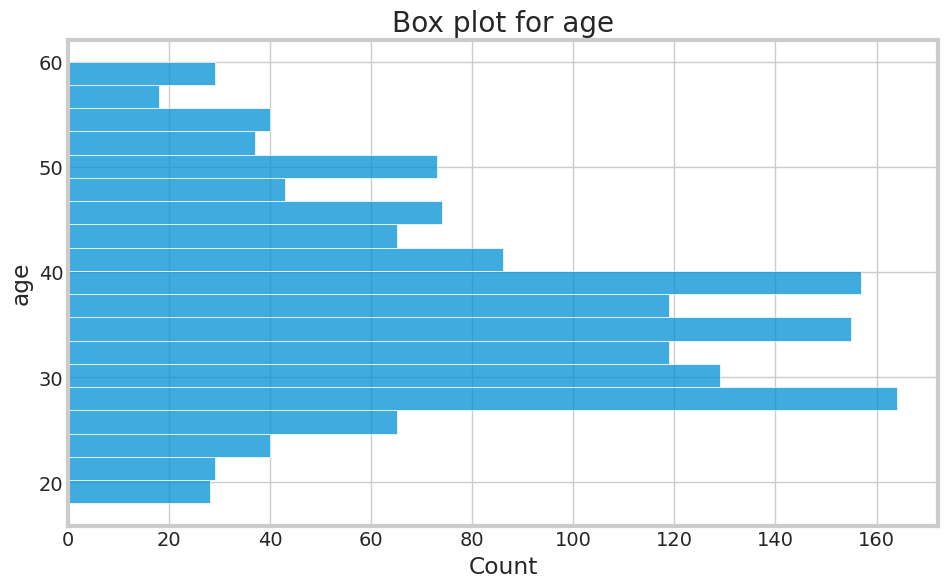

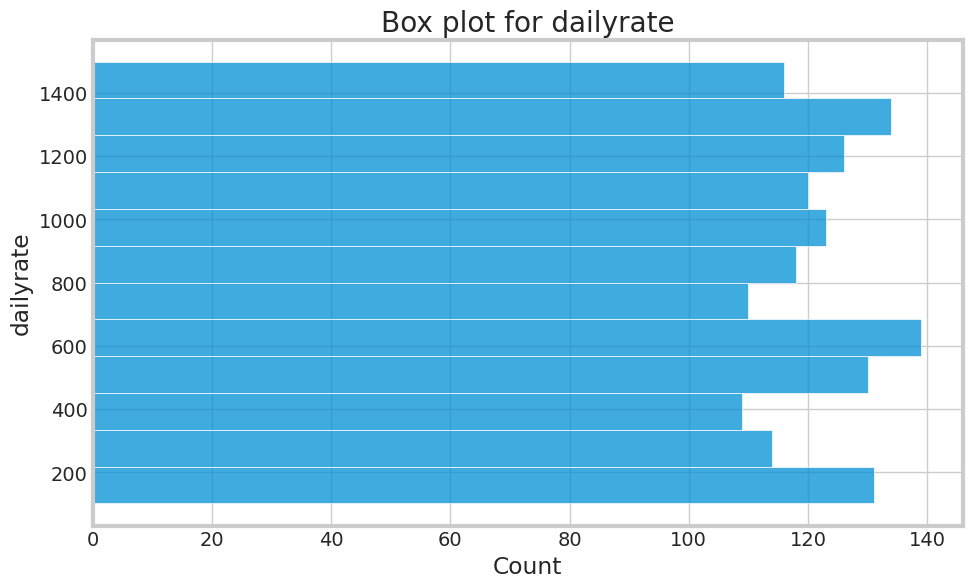

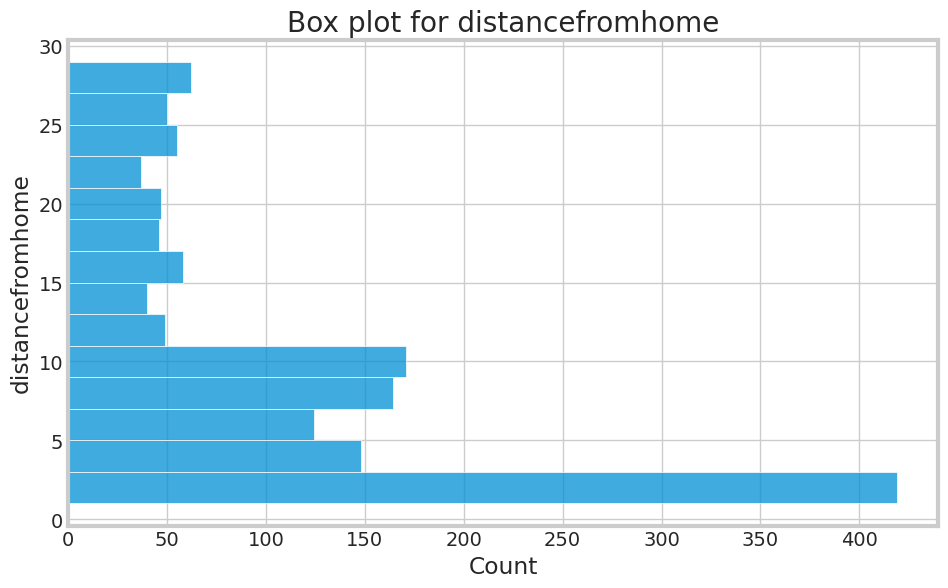

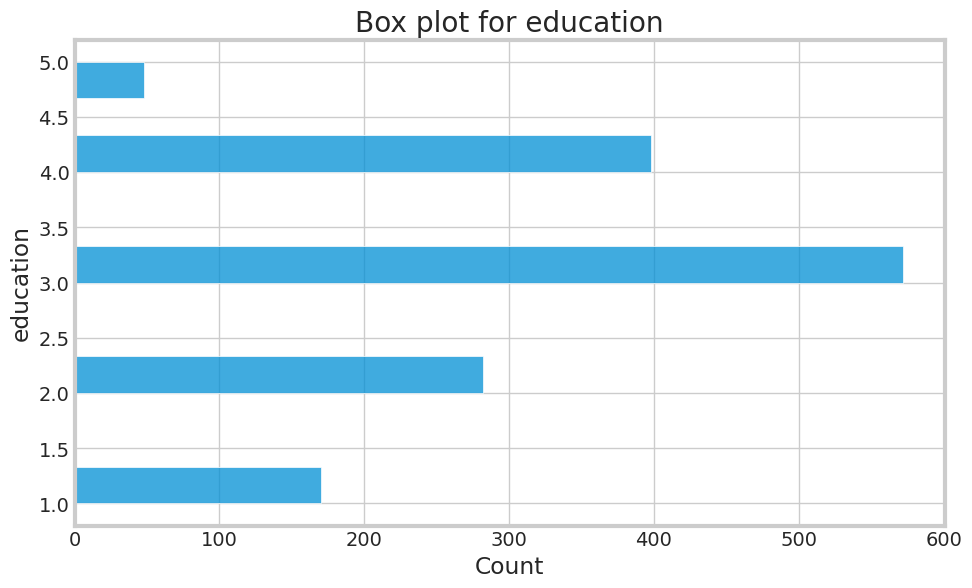

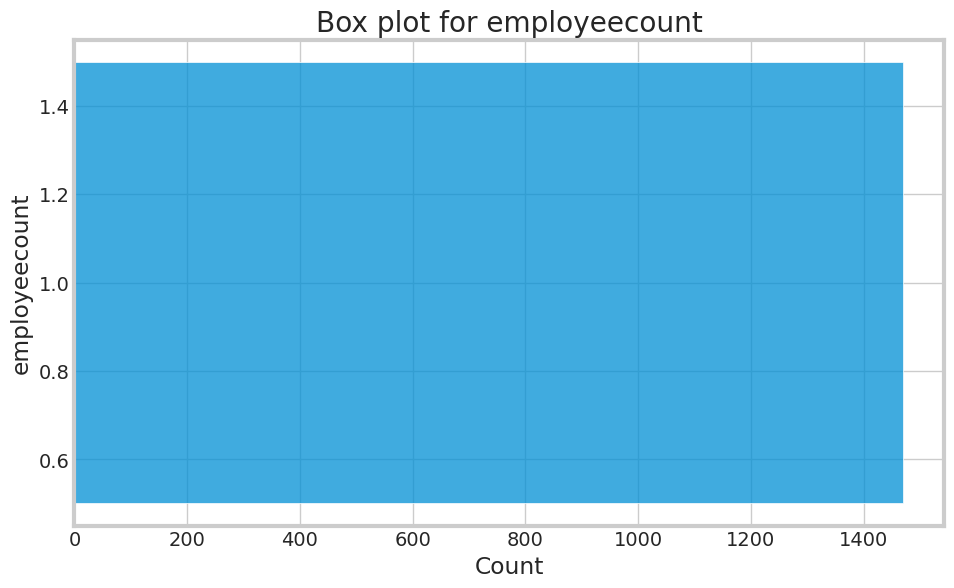

...

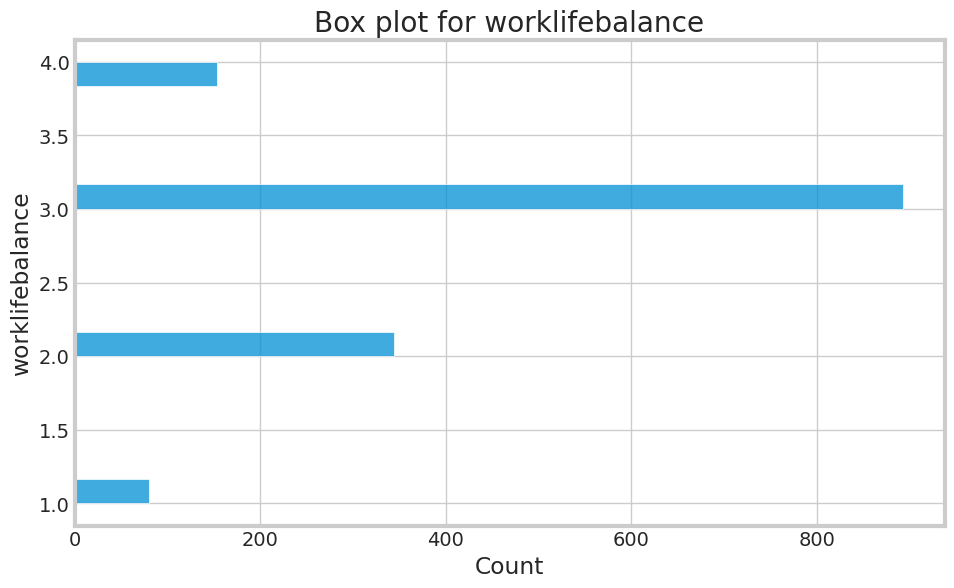

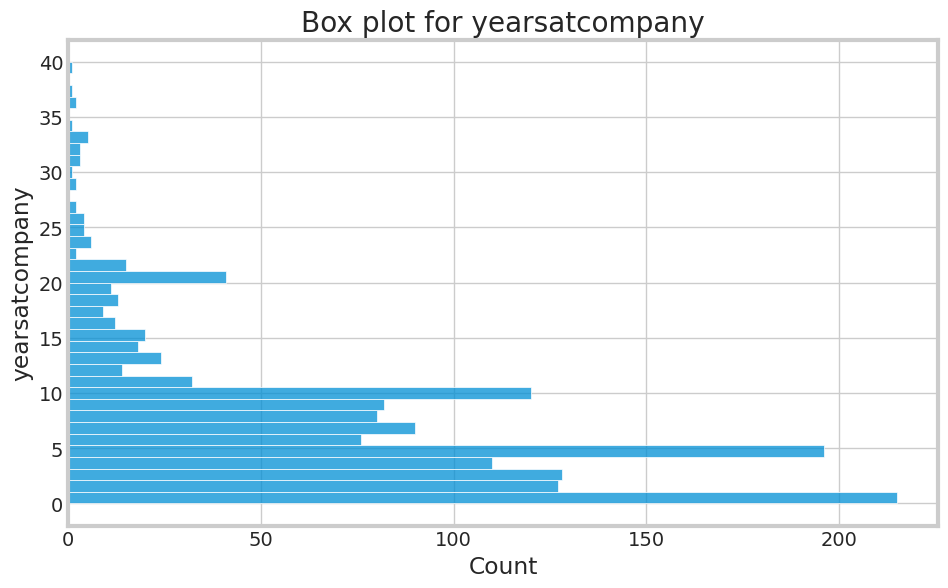

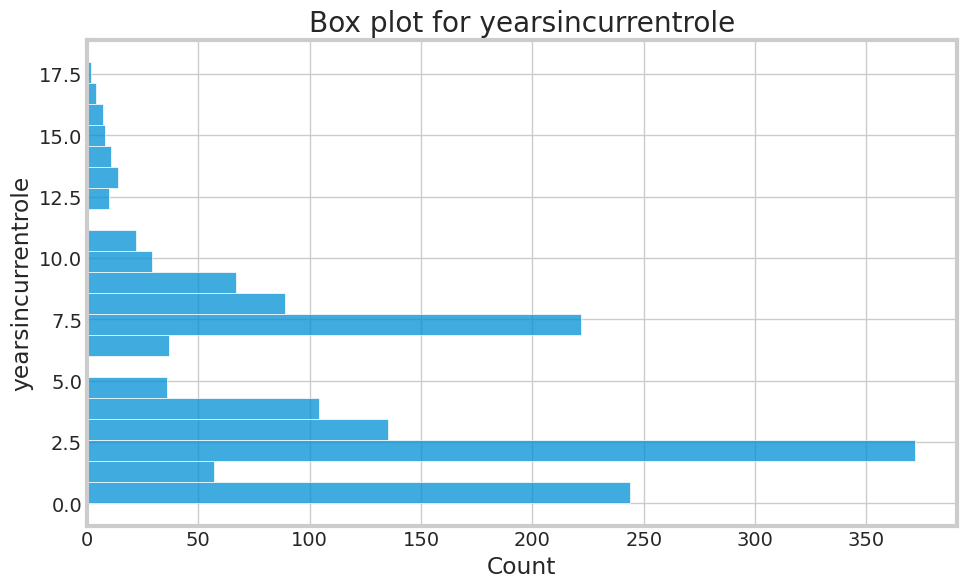

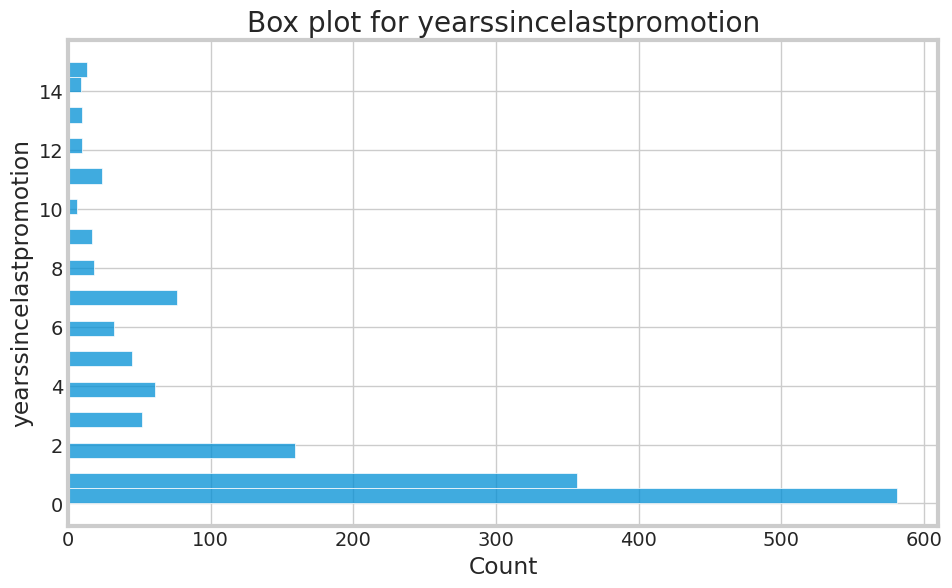

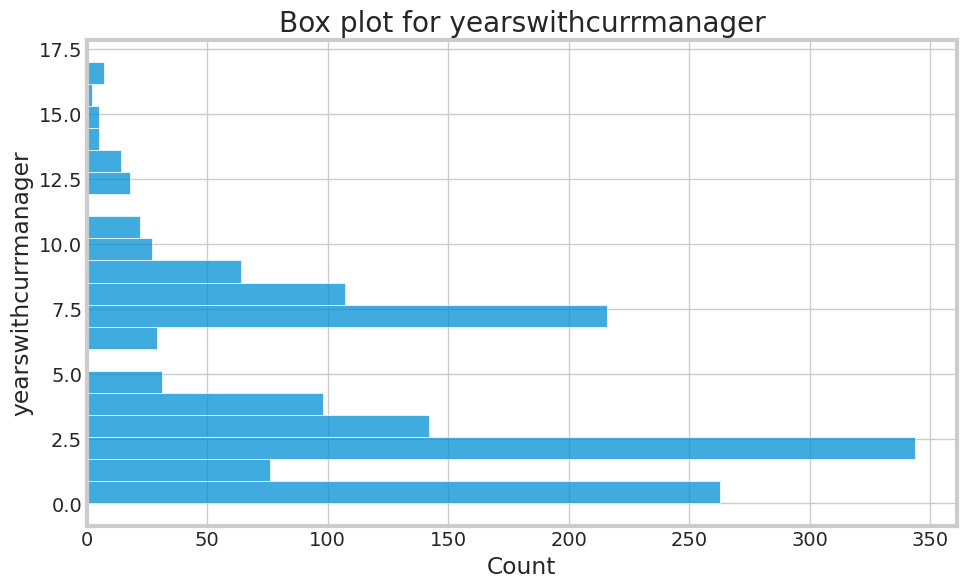

In [148]:
# Check for outliers
# YOUR CODE HERE
# Set the aesthetic style of the plots
sns.set_style("whitegrid")

# Use df DataFrame
numerical_cols = df.select_dtypes(include=['int64', 'float64']).columns.tolist()

for col in numerical_cols:
    plt.figure(figsize=(10, 6))
    sns.histplot(y=df[col])
    plt.title(f'Box plot for {col}')
    plt.show()

In [149]:
df.yearswithcurrmanager.describe()

count    1470.000000
mean        4.123129
std         3.568136
min         0.000000
25%         2.000000
50%         3.000000
75%         7.000000
max        17.000000
Name: yearswithcurrmanager, dtype: float64

<Axes: xlabel='Count', ylabel='age'>

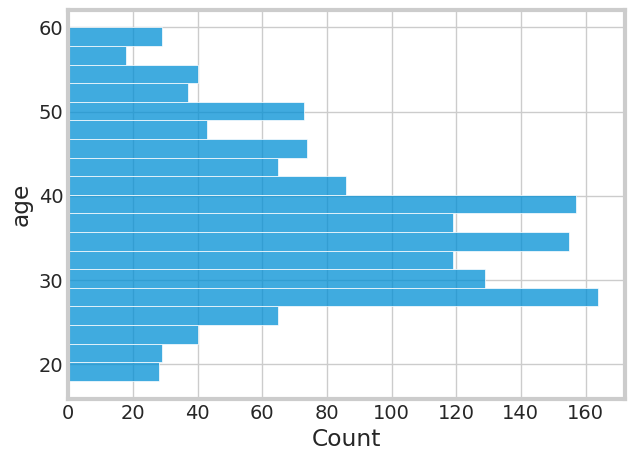

In [150]:
    #plt.figure(figsize=(10, 6))
    feature = 'age'
    #sns.boxplot(y=df[feature])
    #sns.barplot(y=df[feature])
    sns.histplot(y=df[feature])
    #plt.title(feature)
    #plt.show()



### Handling outliers

**Exercise 4: Use lower bound as 25% and upper bound as 75% to handle the outliers [0.5 Mark]**

In [151]:
# YOUR CODE HERE

for col in numerical_cols:
    # Calculate Q1 and Q3
    Q1 = df[col].quantile(0.25)
    Q3 = df[col].quantile(0.75)

    # Cap the data within Q1 and Q3
    df[col] = df[col].clip(lower=Q1, upper=Q3)

print(df.head())

   age attrition     businesstravel  dailyrate              department  \
0   41       Yes      Travel_Rarely       1102                   Sales   
1   43        No  Travel_Frequently        465  Research & Development   
2   37       Yes      Travel_Rarely       1157  Research & Development   
3   33        No  Travel_Frequently       1157  Research & Development   
4   30        No      Travel_Rarely        591  Research & Development   

   distancefromhome  education educationfield  employeecount  employeenumber  \
0                 2          2  Life Sciences              1          491.25   
1                 8          2  Life Sciences              1          491.25   
2                 2          2          Other              1          491.25   
3                 3          4  Life Sciences              1          491.25   
4                 2          2        Medical              1          491.25   

   environmentsatisfaction  gender  hourlyrate  jobinvolvement  joblevel  

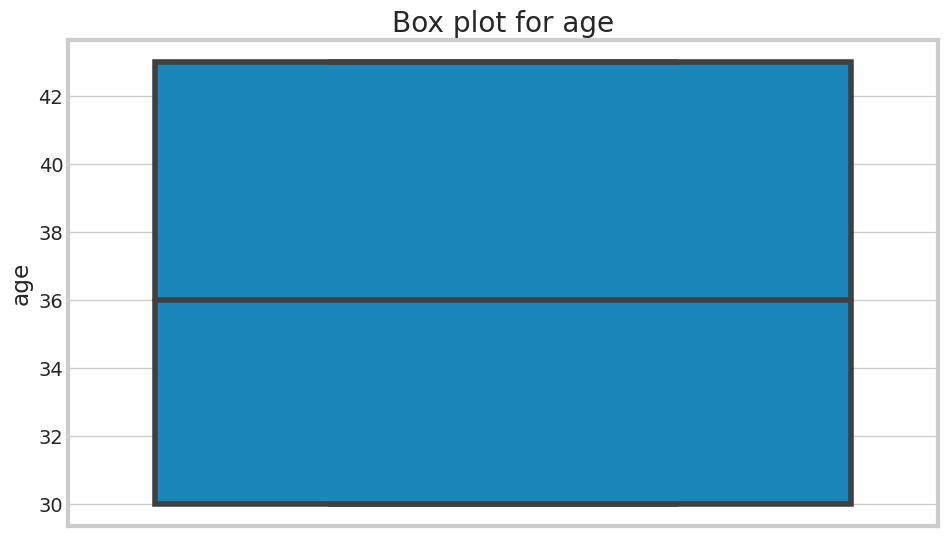

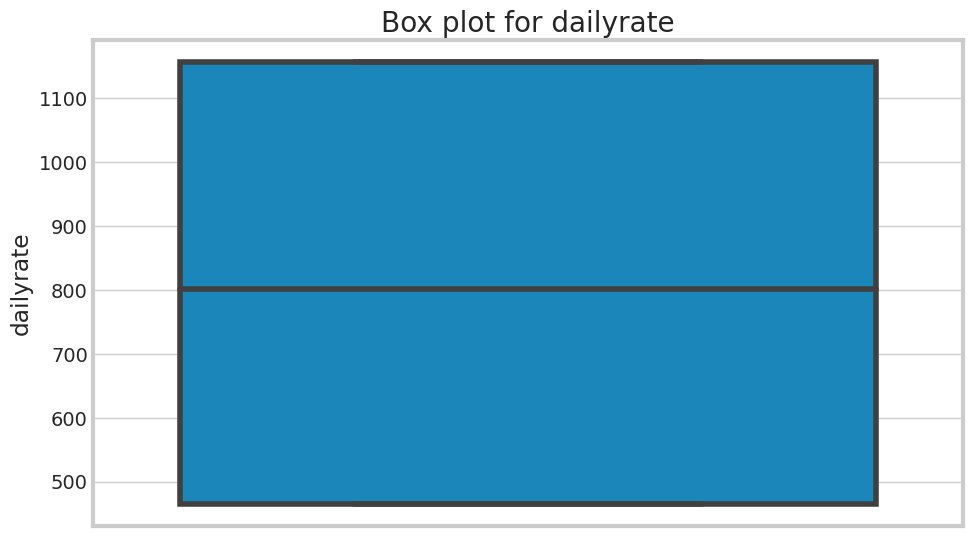

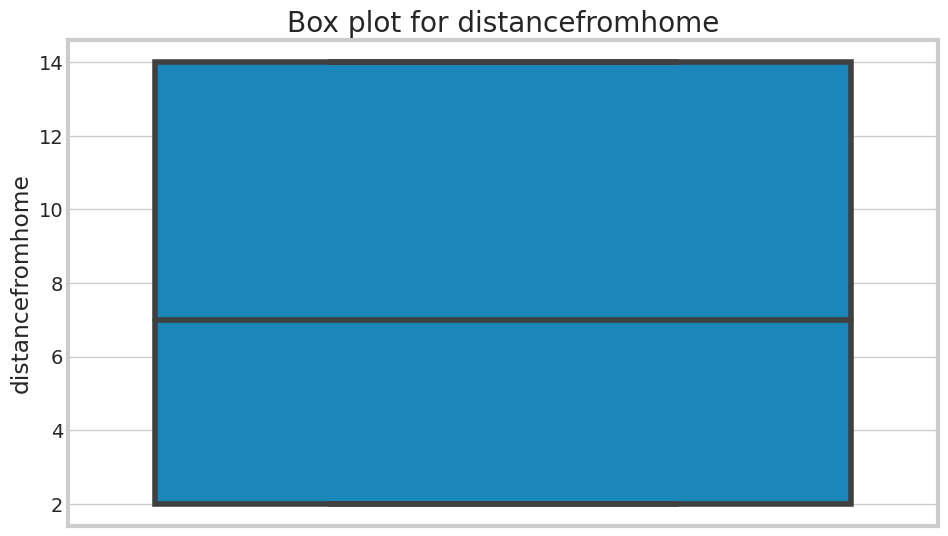

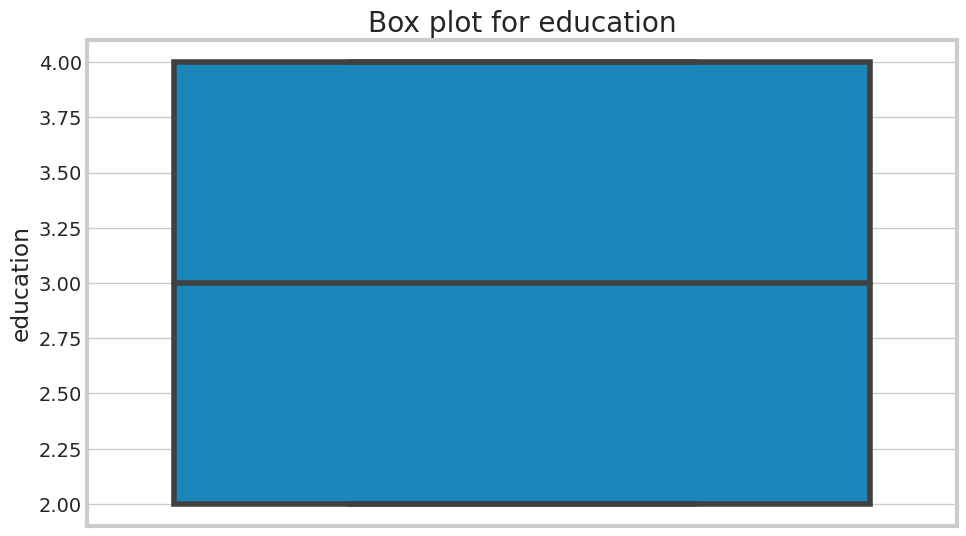

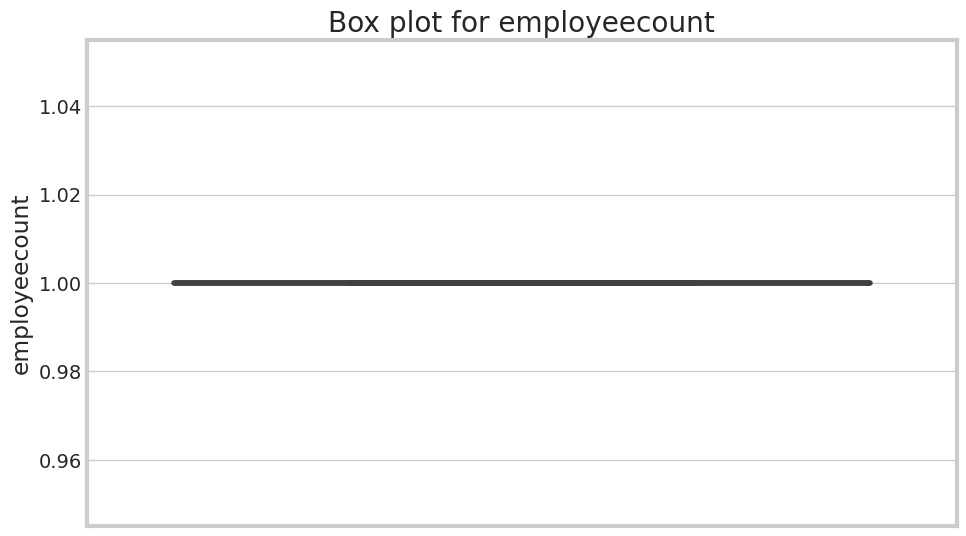

...

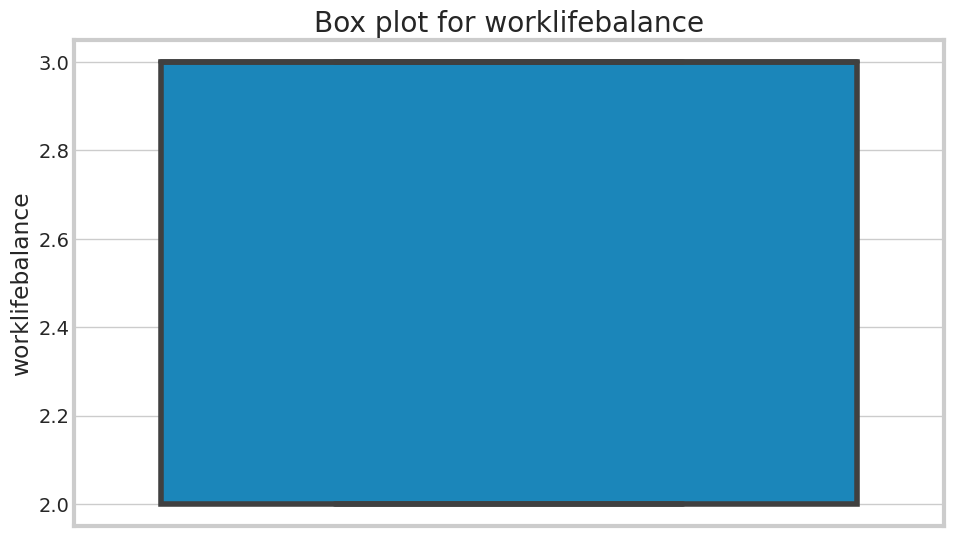

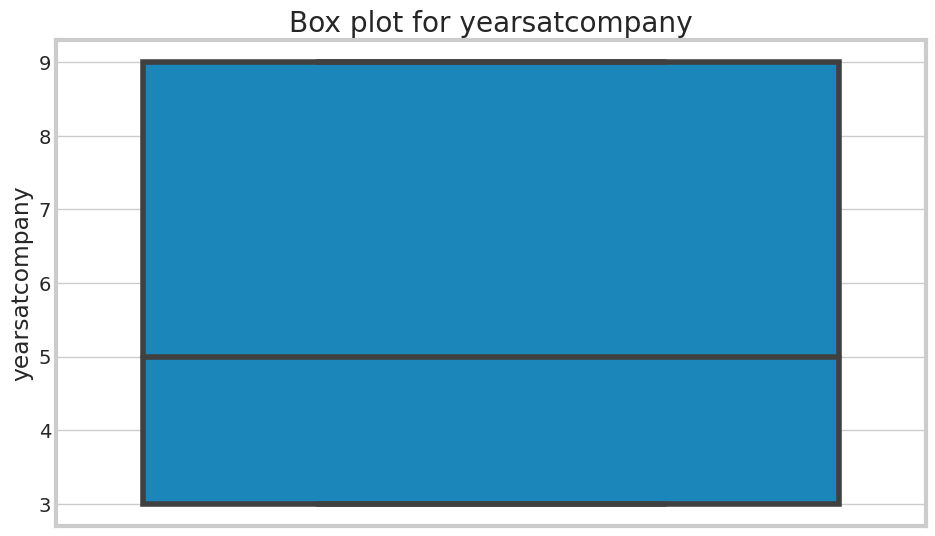

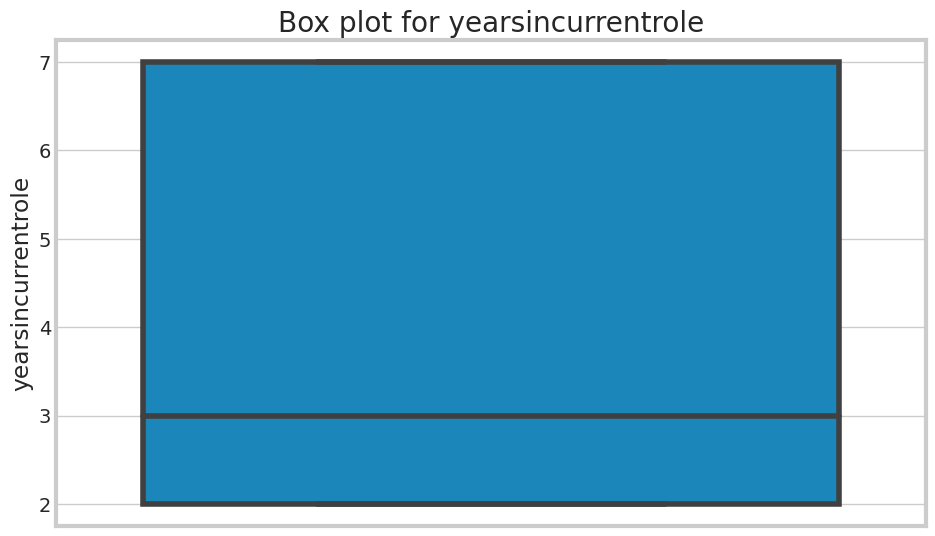

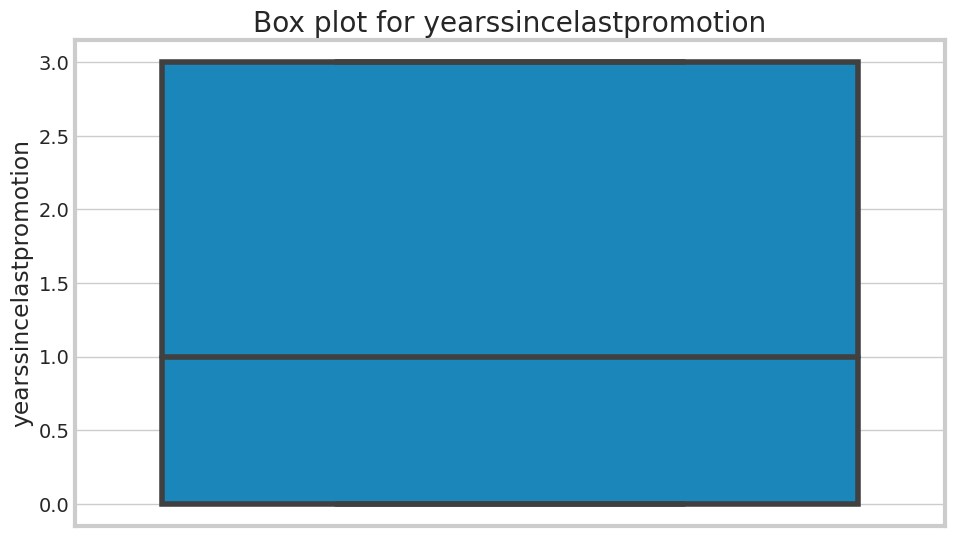

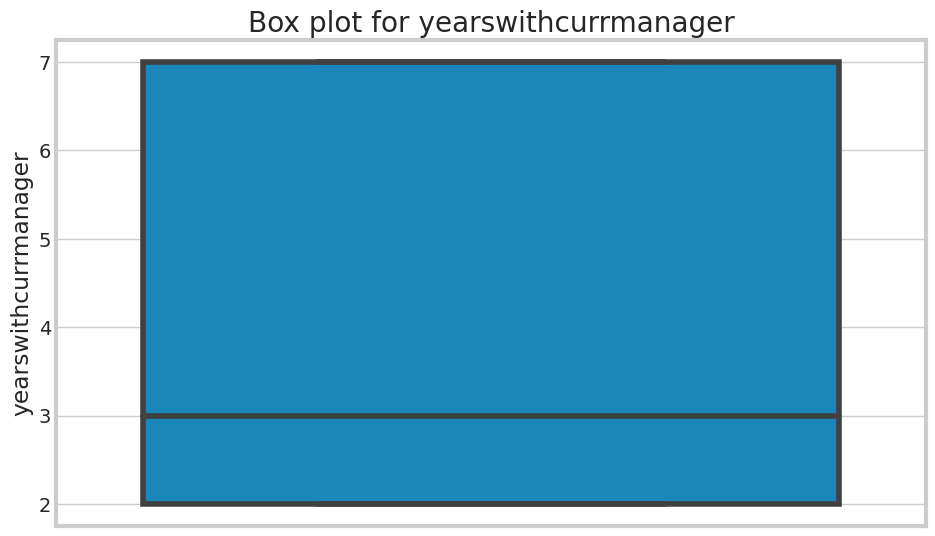

In [152]:
# Recheck for outliers
# YOUR CODE HERE
for col in numerical_cols:
    plt.figure(figsize=(10, 6))
    sns.boxplot(y=df[col])
    plt.title(f'Box plot for {col}')
    plt.show()

### Target label imbalance

**Exercise 5: Check if there is an imbalance in target label [0.5 Mark]**

**Hint:** Use value_counts()

In [153]:
# Count of unique values in Attrition column
# YOUR CODE HERE

# Check the count of each unique value in the target column
target_counts = df['attrition'].value_counts()
print(target_counts)

No     1233
Yes     237
Name: attrition, dtype: int64


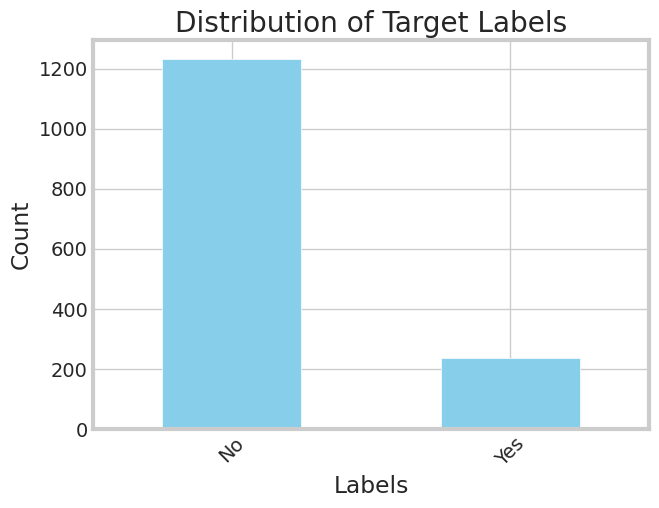

In [154]:
# Plot barplot to visualize balance/imbalance
# YOUR CODE HERE
import matplotlib.pyplot as plt

target_counts.plot(kind='bar', color='skyblue')
plt.title('Distribution of Target Labels')
plt.xlabel('Labels')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.show()

If there is any imbalance in the dataset then a few techniques can be utilised (optional):
1. SMOTE
2. Cross Validation
3. Regularizing the model's parameters

###Plot pairplot

**Exercise 6: Visualize the relationships between the predictor variables and the target variable using a pairplot [0.5 Mark]**

**Hint:** Use sns.pairplot

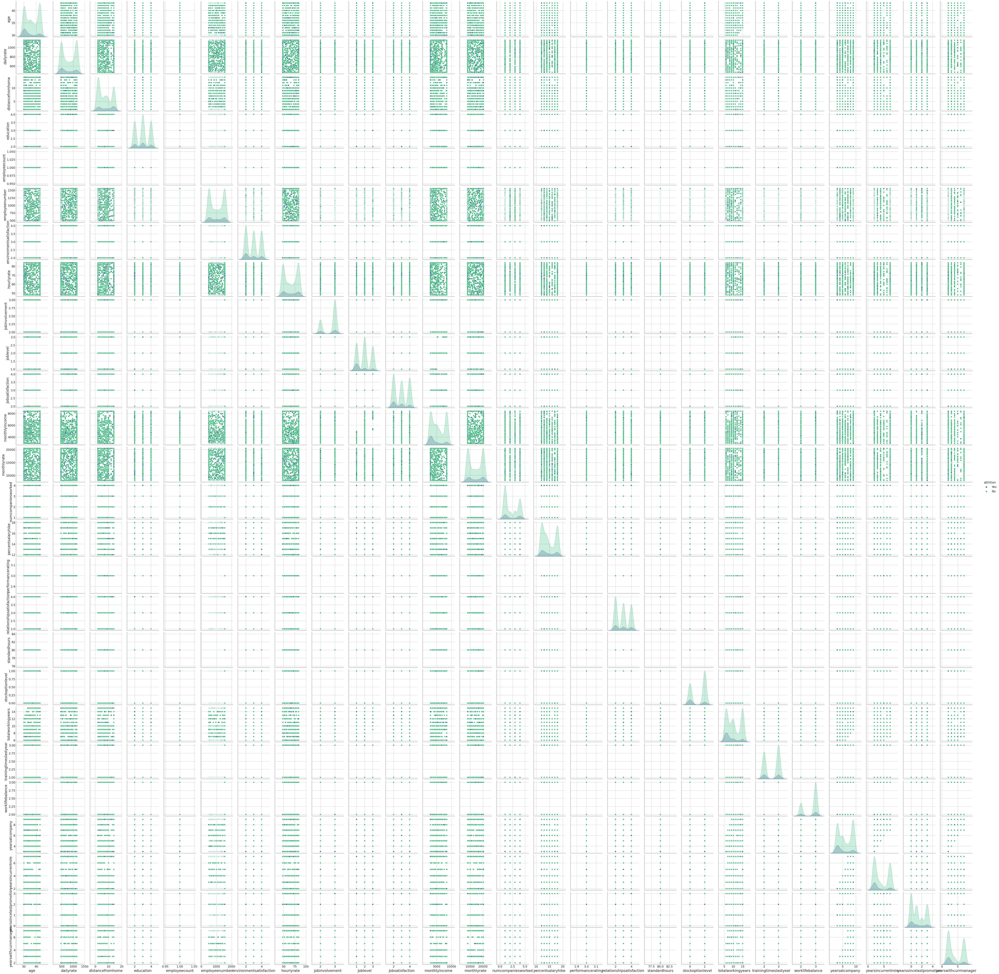

In [155]:
# Visualize a pairplot with relevant features
# YOUR CODE HERE

sns.pairplot(df, hue='attrition', palette='viridis')

plt.show()

### Explore Correlation

- Plotting the Heatmap

**Exercise 7: Visualize the correlation among IBM employee attrition numerical features using a heatmap [0.5 Mark]**

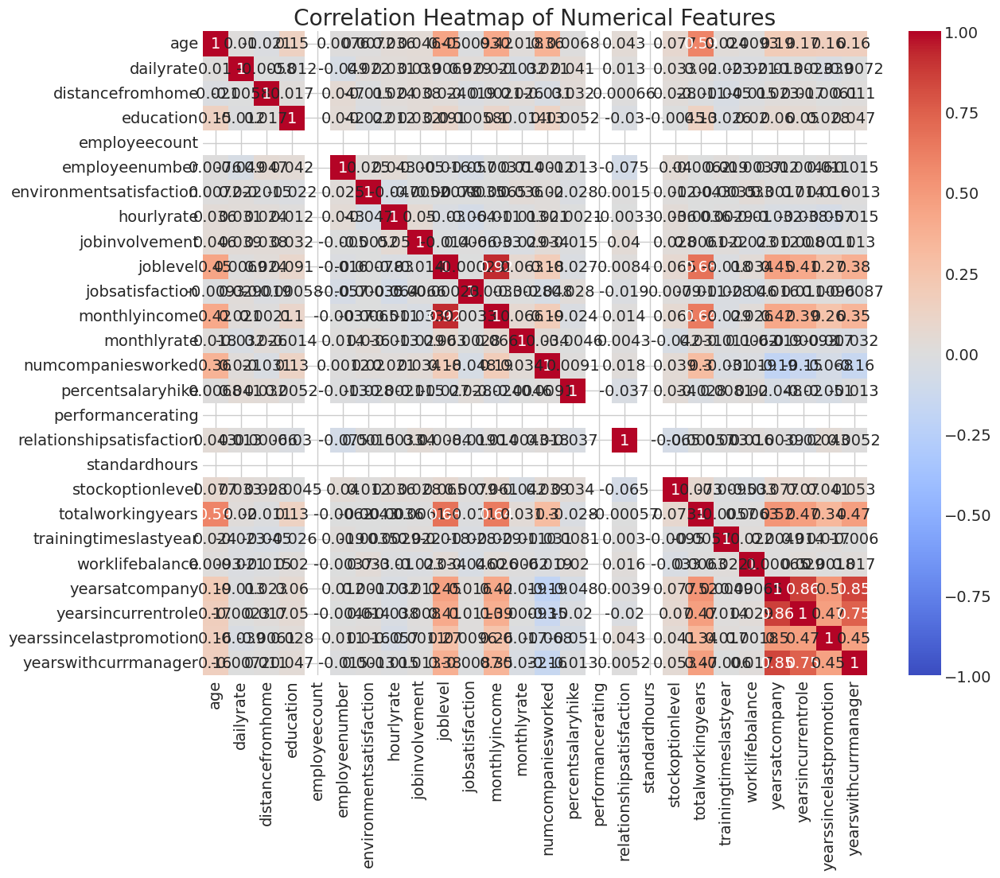

In [156]:
# Visualize heatmap
# YOUR CODE HERE
corr_matrix = df.corr()

# Create a heatmap
plt.figure(figsize=(12, 10))
sns.heatmap(corr_matrix, annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title('Correlation Heatmap of Numerical Features')
plt.show()

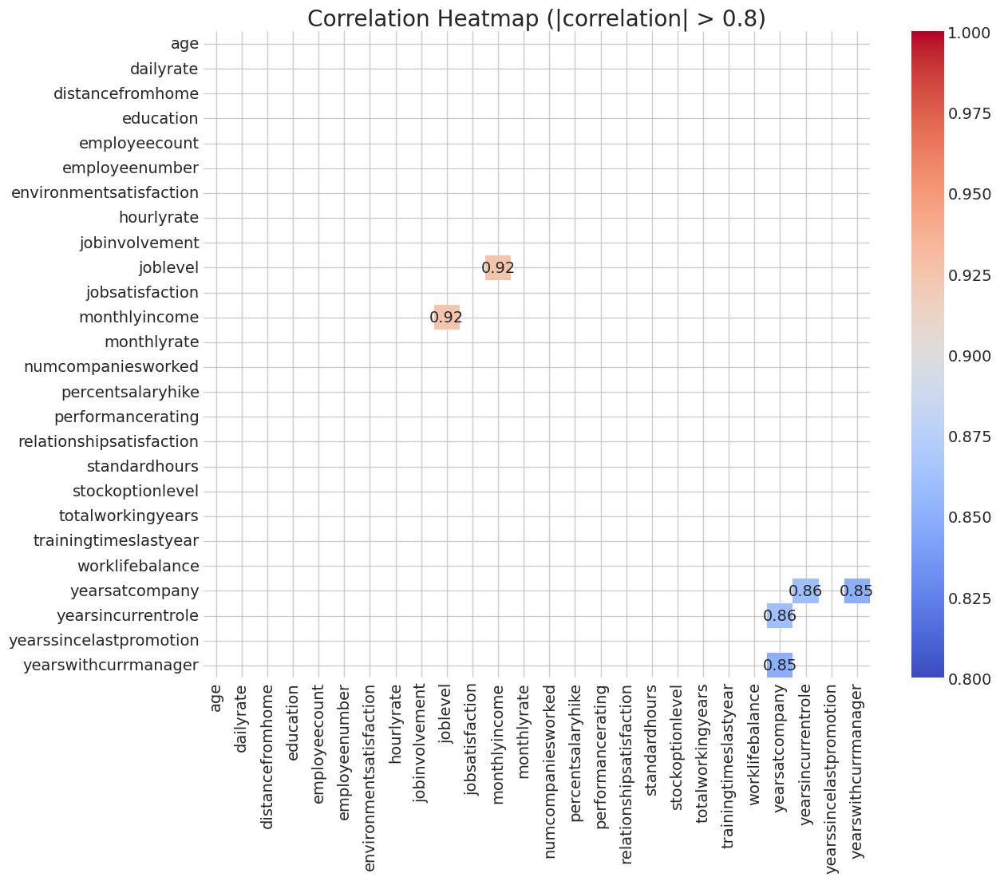

In [157]:
#Since previous correlation map was not very clear we filtered correlation map to show correlations above 0.8
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

# Compute the correlation matrix
correlation_matrix = df.corr()

# Set correlations less than 0.8 to NaN
correlation_matrix[correlation_matrix.abs() <= 0.8] = np.nan

# Set the diagonal to NaN (since they are all 1's and not of interest)
np.fill_diagonal(correlation_matrix.values, np.nan)

# Plot the heatmap
plt.figure(figsize=(12,10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', vmin=0.8, vmax=1, mask=correlation_matrix.isnull())
plt.title('Correlation Heatmap (|correlation| > 0.8)')
plt.show()


Comment on the observations made with the pairplot and heatmap

# Part-B

### Preparing the test feature space
* Remove outliers if any
* Handle the categorical feature if required
* Other processing steps can also be followed.

In [158]:
# YOUR CODE HERE
df.describe()


#Outliers are removed only from numerical columns.

print("Numerical Columns:", numerical_cols)
print("Categorical Columns:", categorical_cols)
#First I

Numerical Columns: ['age', 'dailyrate', 'distancefromhome', 'education', 'employeecount', 'employeenumber', 'environmentsatisfaction', 'hourlyrate', 'jobinvolvement', 'joblevel', 'jobsatisfaction', 'monthlyincome', 'monthlyrate', 'numcompaniesworked', 'percentsalaryhike', 'performancerating', 'relationshipsatisfaction', 'standardhours', 'stockoptionlevel', 'totalworkingyears', 'trainingtimeslastyear', 'worklifebalance', 'yearsatcompany', 'yearsincurrentrole', 'yearssincelastpromotion', 'yearswithcurrmanager']
Categorical Columns: ['attrition', 'businesstravel', 'department', 'educationfield', 'gender', 'jobrole', 'maritalstatus', 'over18', 'overtime']


In [159]:
#Given we have already identified numerical columns earlier let us use the z score to get the outliers
import pandas as pd
import numpy as np
from scipy.stats import zscore

def detect_outliers_using_zscore(df, columns, threshold=3):
    """
    Detect outliers using Z-score for the specified columns in the DataFrame.

    Parameters:
    - df: DataFrame
    - columns: List of column names to check for outliers
    - threshold: Z-score threshold above which a value is considered an outlier. Default is 3.

    Returns:
    - A DataFrame with the same number of rows as df, but only for the specified columns.
      Each cell will be either True (outlier) or False.
    """

    # Calculate Z-scores for the specified columns
    z_scores = np.abs(zscore(df[columns]))

    # Get boolean array indicating presence of outliers
    outliers = z_scores > threshold

    # Create a DataFrame to match the original shape for the specified columns
    outlier_df = pd.DataFrame(outliers, columns=columns, index=df.index)

    return outlier_df



# List of numerical columns as provided
numerical_columns = ['age', 'dailyrate', 'distancefromhome', 'education', 'employeecount',
                     'employeenumber', 'environmentsatisfaction', 'hourlyrate',
                     'jobinvolvement', 'joblevel', 'jobsatisfaction', 'monthlyincome',
                     'monthlyrate', 'numcompaniesworked', 'percentsalaryhike',
                     'performancerating', 'relationshipsatisfaction', 'standardhours',
                     'stockoptionlevel', 'totalworkingyears', 'trainingtimeslastyear',
                     'worklifebalance', 'yearsatcompany', 'yearsincurrentrole',
                     'yearssincelastpromotion', 'yearswithcurrmanager']

outliers_detected = detect_outliers_using_zscore(df, numerical_columns)
print(outliers_detected)


        age  dailyrate  distancefromhome  education  employeecount  \
0     False      False             False      False          False   
1     False      False             False      False          False   
2     False      False             False      False          False   
3     False      False             False      False          False   
4     False      False             False      False          False   
...     ...        ...               ...        ...            ...   
1465  False      False             False      False          False   
1466  False      False             False      False          False   
1467  False      False             False      False          False   
1468  False      False             False      False          False   
1469  False      False             False      False          False   

      employeenumber  environmentsatisfaction  hourlyrate  jobinvolvement  \
0              False                    False       False           False   
1    

In [160]:
print (df)

      age attrition     businesstravel  dailyrate              department  \
0      41       Yes      Travel_Rarely       1102                   Sales   
1      43        No  Travel_Frequently        465  Research & Development   
2      37       Yes      Travel_Rarely       1157  Research & Development   
3      33        No  Travel_Frequently       1157  Research & Development   
4      30        No      Travel_Rarely        591  Research & Development   
...   ...       ...                ...        ...                     ...   
1465   36        No  Travel_Frequently        884  Research & Development   
1466   39        No      Travel_Rarely        613  Research & Development   
1467   30        No      Travel_Rarely        465  Research & Development   
1468   43        No  Travel_Frequently       1023                   Sales   
1469   34        No      Travel_Rarely        628  Research & Development   

      distancefromhome  education educationfield  employeecount  \
0       

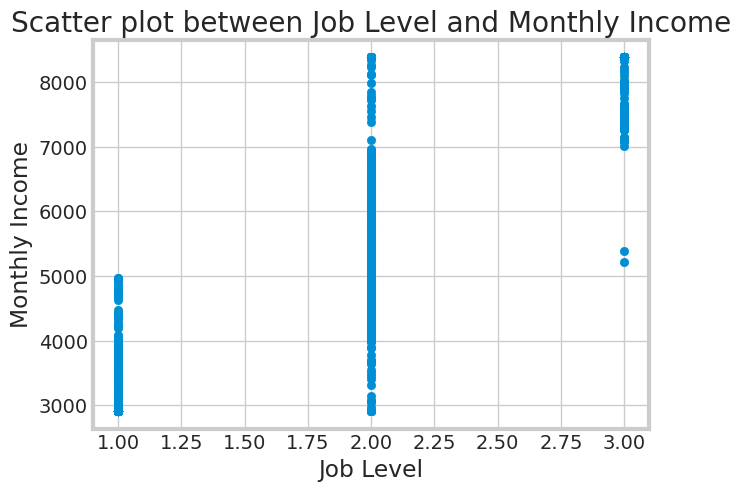

In [161]:
#Joblevel and montlyincome are correlated
import matplotlib.pyplot as plt

plt.scatter(df['joblevel'], df['monthlyincome'])
plt.xlabel('Job Level')
plt.ylabel('Monthly Income')
plt.title('Scatter plot between Job Level and Monthly Income')
plt.show()


Since MonthlyIncome has more discrete values, we want to retain that and drop the JobLevel

In [162]:
df = df.drop('joblevel', axis=1)

In [163]:
#confirming that column is dropped
df.shape

(1470, 34)

Optional:
Use `Hyperopt`, a hyperparameter tuning technique to identify the best set of parameters.

In the notebook, data processing is done separately for different models.
Considering the fact that different models may require data in different format and in turn different processes may be followed to process the data.

If the processing steps followed for the models are same, data processing can also be done once.

## Apply CatBoost

Catboost was released in 2017 by Yandex, showing, by their benchmark to be faster in prediction, better in accuracy, and easier to use for categorical data across a series of GBDT tasks. Additional capabilities of catboost include plotting feature interactions and object (row) importance.

[Here](https://catboost.ai/en/docs/) is the official documentation of CatBoost

In [164]:
! pip show catboost

Name: catboost
Version: 1.2.2
Summary: CatBoost Python Package
Home-page: https://catboost.ai
Author: CatBoost Developers
Author-email: 
License: Apache License, Version 2.0
Location: /usr/local/lib/python3.10/dist-packages
Requires: graphviz, matplotlib, numpy, pandas, plotly, scipy, six
Required-by: 


### Data Processing for CatBoost

**Exercise 8: Data processing for CatBoost [1 Mark]**
* **Copy the dataframe that was created after removing the outliers**
* **Handle the categorical features if required**
* **Create target column and feature space**

In [165]:
#copying the dataframe
df_catboost = df.copy()


In [166]:
!pip install xgboost

In [167]:
#Split the dataframe
from sklearn.model_selection import train_test_split

X = df_catboost.drop('attrition', axis=1)
y = df_catboost['attrition']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)


**Hint:** Column containing the information on attrition will be the target column.

In [168]:
# Copy the data
# YOUR CODE HERE

In [169]:
# Target Column
# YOUR CODE HERE
print (y)

0       Yes
1        No
2       Yes
3        No
4        No
       ... 
1465     No
1466     No
1467     No
1468     No
1469     No
Name: attrition, Length: 1470, dtype: object


In [170]:
# Feature Space

#First checking categorical columns
print("Categorical Columns:", categorical_cols)
# YOUR CODE HERE

Categorical Columns: ['attrition', 'businesstravel', 'department', 'educationfield', 'gender', 'jobrole', 'maritalstatus', 'over18', 'overtime']


In [171]:
!pip install hyperopt


In [172]:
#Define objective function
from catboost import CatBoostClassifier
from sklearn.model_selection import cross_val_score
categorical_features_names = ['businesstravel', 'department', 'educationfield', 'gender',
                              'jobrole', 'maritalstatus', 'over18', 'overtime']


def objective(params):
    model = CatBoostClassifier(iterations=100, # fixed number for this example
                               learning_rate=params['learning_rate'],
                               depth=int(params['depth']),
                               cat_features=categorical_features_names,
                               verbose=0) # silent training

    # Using cross-validation for a more robust result
    score = cross_val_score(model, X_train, y_train, cv=3).mean()
    return -score  # since we want to maximize accuracy

#Define Parmeter Space
from hyperopt import hp


space = {
    'learning_rate': hp.uniform('learning_rate', 0.01, 0.5),
    'depth': hp.quniform('depth', 4, 10, 1),
    'l2_leaf_reg': hp.uniform('l2_leaf_reg', 1, 10),
    'iterations': hp.quniform('iterations', 100, 1000, 1),
    'border_count': hp.quniform('border_count', 32, 255, 5),
    'bagging_temperature': hp.uniform('bagging_temperature', 0, 1)
}

#Run the optimizer
from hyperopt import fmin, tpe, Trials

trials = Trials()
best = fmin(fn=objective,
            space=space,
            algo=tpe.suggest,
            max_evals=50,
            trials=trials)



100%|██████████| 50/50 [00:51<00:00,  1.04s/trial, best loss: -0.8690476190476191]


In [173]:
#Now print the best parameters
best_params = {
    'learning_rate': best['learning_rate'],
    'depth': int(best['depth']),
    'l2_leaf_reg': best['l2_leaf_reg'],
    'iterations': best['iterations'],
    'border_count': best['border_count'],
    'bagging_temperature': best['bagging_temperature']
}

print(best_params)


{'learning_rate': 0.10913756624643971, 'depth': 4, 'l2_leaf_reg': 4.011295761143857, 'iterations': 381.0, 'border_count': 130.0, 'bagging_temperature': 0.9872526468580503}


In [174]:
#Now Train the model with best parameters
model = CatBoostClassifier(**best_params, cat_features=categorical_features_names, verbose=200)
model.fit(X_train, y_train)


0:	learn: 0.6242621	total: 4.96ms	remaining: 1.88s
200:	learn: 0.1549432	total: 522ms	remaining: 468ms
380:	learn: 0.0855583	total: 989ms	remaining: 0us


### Model Definition

**Exercise 9: Define, train the model and display the results [2 Mark]**

**Hint:**
* Use CatBoostClassifier() to define the model with relevant parameters.
* Use `fit` to fit the data to the model. Refer [here](https://catboost.ai/en/docs/concepts/speed-up-training) to see some ways to speedup CatBoost training.
* Evaluate the model using roc_auc_score, accuracy_score, f1_score, predict methods or other relevant techniques.

In [175]:
# Create CatBoost model
# YOUR CODE HERE
categorical_features_names = ['businesstravel', 'department', 'educationfield', 'gender',
                              'jobrole', 'maritalstatus', 'over18', 'overtime']

model = CatBoostClassifier(cat_features=categorical_features_names)


In [176]:
# Model training
# YOUR CODE HERE
model.fit(X_train, y_train)

Learning rate set to 0.011041
0:	learn: 0.6844485	total: 4.25ms	remaining: 4.24s
1:	learn: 0.6763823	total: 19.4ms	remaining: 9.7s
2:	learn: 0.6663176	total: 27ms	remaining: 8.98s
3:	learn: 0.6584073	total: 31.6ms	remaining: 7.86s
4:	learn: 0.6502243	total: 35.8ms	remaining: 7.12s
5:	learn: 0.6421976	total: 42ms	remaining: 6.95s
6:	learn: 0.6358364	total: 47.4ms	remaining: 6.73s
7:	learn: 0.6288128	total: 52ms	remaining: 6.44s
8:	learn: 0.6230959	total: 55.4ms	remaining: 6.1s
9:	learn: 0.6157600	total: 59.1ms	remaining: 5.85s
10:	learn: 0.6101146	total: 62.4ms	remaining: 5.61s
11:	learn: 0.6031841	total: 65.6ms	remaining: 5.4s
12:	learn: 0.5980821	total: 68.8ms	remaining: 5.22s
13:	learn: 0.5930000	total: 74.2ms	remaining: 5.22s
14:	learn: 0.5871102	total: 78.8ms	remaining: 5.17s
15:	learn: 0.5808277	total: 86.5ms	remaining: 5.32s
16:	learn: 0.5760551	total: 93ms	remaining: 5.38s
17:	learn: 0.5719713	total: 95.2ms	remaining: 5.2s
18:	learn: 0.5663118	total: 101ms	remaining: 5.2s
19:	le

### Model performance

In [177]:
# Model performance on all sets
# YOUR CODE HERE
y_pred = model.predict(X_test)


from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

# Accuracy
catboost_accuracy = accuracy_score(y_test, y_pred)
catboost_precision = precision_score(y_test, y_pred, pos_label='Yes')
catboost_recall = recall_score(y_test, y_pred, pos_label='Yes')
catboost_f1 = f1_score(y_test, y_pred, pos_label='Yes')
print(f"Accuracy: {catboost_accuracy:.4f}")
print(f"precision: {catboost_precision:.4f}")
print(f"recall: {catboost_recall:.4f}")
print(f"F1 Score: {catboost_f1:.4f}")




Accuracy: 0.8844
precision: 0.7778
recall: 0.1795
F1 Score: 0.2917


## Apply XGBoost

XGBoost is a workhorse gradient boosted decision tree algorithm. Its been around since 2014 and has come to dominate the Kaggle and data science community. XGB introduced gradient boosting where new models are fit to the residuals of prior models and then added together, using a gradient descent algorithm to minimize the loss.

Read [here](https://xgboost.readthedocs.io/en/stable/parameter.html) on XGBoost parameters.

Refer [here](https://xgboost.readthedocs.io/en/stable/python/python_api.html#xgboost.XGBClassifier) for the official documentation of XGBoost classifier.

### Data Processing for XGBoost


**Exercise 10: Data Processing for XGBoost [1 Mark]**
* **Copy the dataframe after the outliers were removed.**
* **Handle the categorical features if required**
* **Create target column and feature space**

In [183]:
# Copy dataframe
# YOUR CODE HERE
df_xgboost = df.copy()

In [184]:
df_xgboost

,age,attrition,businesstravel,dailyrate,department,distancefromhome,education,educationfield,employeecount,employeenumber,environmentsatisfaction,gender,hourlyrate,jobinvolvement,jobrole,jobsatisfaction,maritalstatus,monthlyincome,monthlyrate,numcompaniesworked,over18,overtime,percentsalaryhike,performancerating,relationshipsatisfaction,standardhours,stockoptionlevel,totalworkingyears,trainingtimeslastyear,worklifebalance,yearsatcompany,yearsincurrentrole,yearssincelastpromotion,yearswithcurrmanager
0,41,Yes,Travel_Rarely,1102,Sales,2,2,Life Sciences,1,491.25,2,Female,83.75,3,Sales Executive,4,Single,5993,19479.0,4,Y,Yes,12,3,2,80,0,8,2,2,6,4,0,5
1,43,No,Travel_Frequently,465,Research & Development,8,2,Life Sciences,1,491.25,3,Male,61.00,2,Research Scientist,2,Married,5130,20461.5,1,Y,No,18,3,4,80,1,10,3,3,9,7,1,7
2,37,Yes,Travel_Rarely,1157,Research & Development,2,2,Other,1,491.25,4,Male,83.75,2,Laboratory Technician,3,Single,2911,8047.0,4,Y,Yes,15,3,2,80,0,7,3,3,3,2,0,2
3,33,No,Travel_Frequently,1157,Research & Development,3,4,Life Sciences,1,491.25,4,Female,56.00,3,Research Scientist,3,Married,2911,20461.5,1,Y,Yes,12,3,3,80,0,8,3,3,8,7,3,2
4,30,No,Travel_Rarely,591,Research & Development,2,2,Medical,1,491.25,2,Male,48.00,3,Laboratory Technician,2,Married,3468,16632.0,4,Y,No,12,3,4,80,1,6,3,3,3,2,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1465,36,No,Travel_Frequently,884,Research & Development,14,2,Medical,1,1555.75,3,Male,48.00,3,Laboratory Technician,4,Married,2911,12290.0,4,Y,No,17,3,3,80,1,15,3,3,5,2,0,3
1466,39,No,Travel_Rarely,613,Research & Development,6,2,Medical,1,1555.75,4,Male,48.00,2,Healthcare Representative,2,Married,8379,20461.5,4,Y,No,15,3,2,80,1,9,3,3,7,7,1,7
1467,30,No,Travel_Rarely,465,Research & Development,4,3,Life Sciences,1,1555.75,2,Male,83.75,3,Manufacturing Director,2,Married,6142,8047.0,1,Y,Yes,18,3,2,80,1,6,2,3,6,2,0,3
1468,43,No,Travel_Frequently,1023,Sales,2,3,Medical,1,1555.75,4,Male,63.00,2,Sales Executive,2,Married,5390,13243.0,2,Y,No,14,3,4,80,0,15,3,2,9,6,0,7


**Hint:** Use pd.get_dummies

In [185]:
# Handling categorical features
# YOUR CODE HERE
categorical_columns = ['businesstravel', 'department', 'educationfield', 'gender', 'jobrole', 'maritalstatus', 'over18', 'overtime']

df_xgboost = pd.get_dummies(df_xgboost, columns=categorical_columns)



In [186]:
# Concat the dummy variables to actual dataframe and remove initial categorical columns
# YOUR CODE HERE
df_xgboost.shape

(1470, 55)

When creating the dummy variables, the name of attrition column was changed, rename to 'attrition' again.

**Hint:** Use .rename

In [187]:
# Rename target column
# YOUR CODE HERE
from sklearn.preprocessing import LabelEncoder

# Initialize label encoder
le = LabelEncoder()

# Fit and transform the 'attrition' column
df_xgboost['attrition'] = le.fit_transform(df_xgboost['attrition'])

# To get the mapping between original labels and encoded labels
label_mapping = dict(zip(le.classes_, le.transform(le.classes_)))
print(label_mapping)


{'No': 0, 'Yes': 1}


In [ ]:
# Feature Space
# YOUR CODE HERE



# Targer label
# YOUR CODE HERE

### Model Definition

**Exercise 11: Define, train the model and display the results [2 Mark]**

**Hint:**
* Use XGBClassifier() to define the model with relevant parameters.
* Use `fit` to fit the data to the model.
* Evaluate the model using roc_auc_score, accuracy_score, f1_score, predict methods or other relevant techniques.

In [188]:
# Create XGBoost classifier model
# YOUR CODE HERE

from sklearn.model_selection import train_test_split

X = df_xgboost.drop('attrition', axis=1)
y = df_xgboost['attrition']

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)





In [189]:
print(X_train.dtypes)
print(y_train.dtype)

age                                    int64
dailyrate                              int64
distancefromhome                       int64
education                              int64
employeecount                          int64
employeenumber                       float64
environmentsatisfaction                int64
hourlyrate                           float64
jobinvolvement                         int64
jobsatisfaction                        int64
monthlyincome                          int64
monthlyrate                          float64
numcompaniesworked                     int64
percentsalaryhike                      int64
performancerating                      int64
relationshipsatisfaction               int64
standardhours                          int64
stockoptionlevel                       int64
totalworkingyears                      int64
trainingtimeslastyear                  int64
worklifebalance                        int64
yearsatcompany                         int64
yearsincur

In [190]:
import xgboost as xgb

dtrain = xgb.DMatrix(X_train, label=y_train, missing=np.nan)
dtest = xgb.DMatrix(X_test, label=y_test)

params = {
    'objective': 'binary:logistic',
    'eval_metric': 'logloss',
    'max_depth': 6,
    'eta': 0.3
}




In [191]:
# Model training
# YOUR CODE HERE
num_rounds = 100
bst = xgb.train(params, dtrain, num_rounds)

### Model Performance

In [192]:
# Model performance on all sets
# YOUR CODE HERE

#Model prediction
y_pred = bst.predict(dtest)
y_pred_label = [1 if p > 0.5 else 0 for p in y_pred]

In [193]:
#Evaluate the model
from sklearn.metrics import accuracy_score, roc_auc_score





accuracy = accuracy_score(y_test, y_pred_label)
print(f"Accuracy: {accuracy:.4f}")

auc = roc_auc_score(y_test, y_pred)
print(f"ROC AUC: {auc:.4f}")


Accuracy: 0.8605
ROC AUC: 0.7305


In [199]:
# Model performance on all sets
# YOUR CODE HERE
y_pred = bst.predict(dtest)


from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score

# Accuracy
xgb_accuracy = accuracy_score(y_test, y_pred_label)
xgb_precision = precision_score(y_test, y_pred_label)
xgb_recall = recall_score(y_test, y_pred_label)
xgb_f1 = f1_score(y_test, y_pred_label)
print(f"Accuracy: {xgb_accuracy:.4f}")
print(f"precision: {xgb_precision:.4f}")
print(f"recall: {xgb_recall:.4f}")
print(f"F1 Score: {xgb_f1:.4f}")




Accuracy: 0.8605
precision: 0.4500
recall: 0.2308
F1 Score: 0.3051


<Figure size 6000x8000 with 0 Axes>

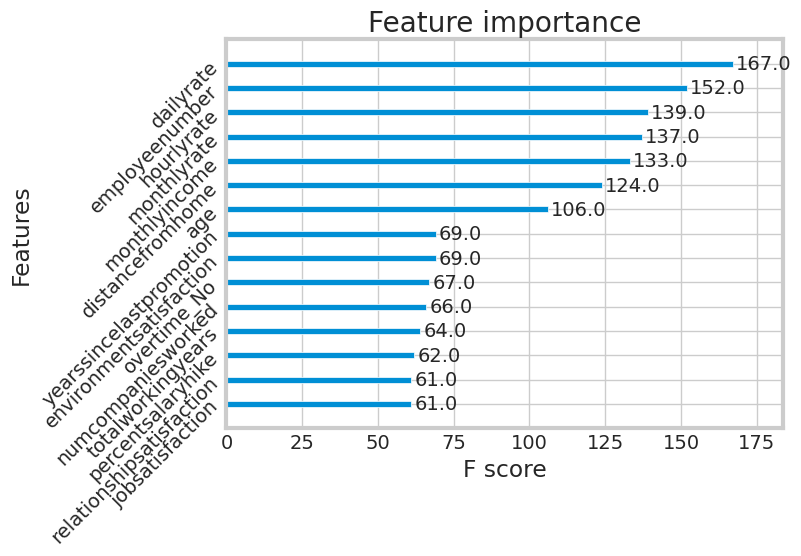

In [200]:
#Plot the performance
import matplotlib.pyplot as plt

# Set figure size
plt.figure(figsize=(60,80))

# Plot importance for top 20 features to avoid overcrowding
xgb.plot_importance(bst, max_num_features=15, height=0.25)

# Rotate feature names for better readability (optional)
plt.yticks(rotation=45)
#plt.tight_layout()

plt.show()



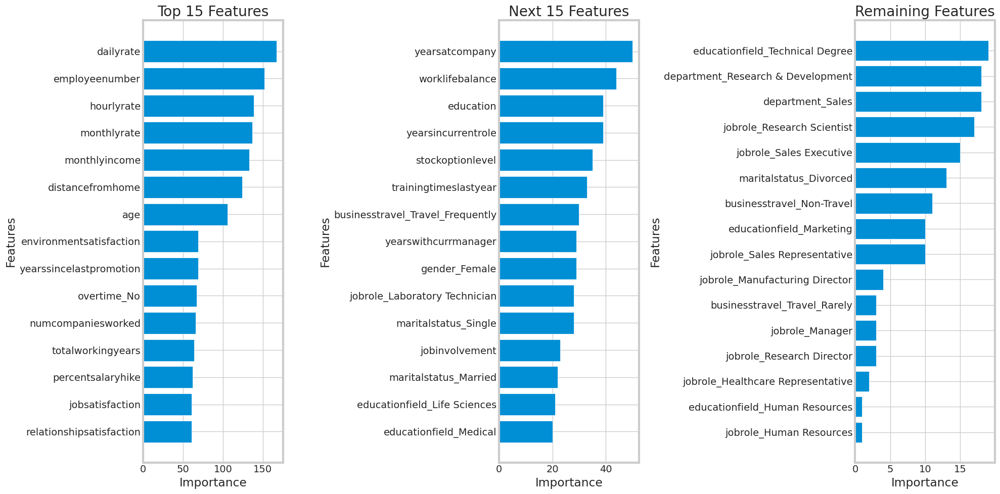

In [201]:
import matplotlib.pyplot as plt

# Extract feature importances
importances = bst.get_score(importance_type='weight')
sorted_importances = sorted(importances.items(), key=lambda x: x[1], reverse=True)

# Divide the features into three groups
first_15 = sorted_importances[:15]
next_15 = sorted_importances[15:30]
remaining = sorted_importances[30:]

def plot_importance(features, ax):
    names, values = zip(*features)
    ax.barh(names, values)
    ax.set_xlabel('Importance')
    ax.set_ylabel('Features')
    ax.invert_yaxis()  # Most important feature at the top

# Create three side-by-side plots
fig, axes = plt.subplots(nrows=1, ncols=3, figsize=(20, 10))

plot_importance(first_15, axes[0])
axes[0].set_title('Top 15 Features')

plot_importance(next_15, axes[1])
axes[1].set_title('Next 15 Features')

plot_importance(remaining, axes[2])
axes[2].set_title('Remaining Features')

plt.tight_layout()
plt.show()


## Apply LightGBM (Optional)

LightGBM is an open-source GBDT framework created by Microsoft as a fast and scalable alternative to XGB and GBM. By default LightGBM will train a Gradient Boosted Decision Tree (GBDT), but it also supports random forests, Dropouts meet Multiple Additive Regression Trees (DART), and Gradient Based One-Side Sampling (Goss).

To know more about LightGBM parameters, refer [here](https://lightgbm.readthedocs.io/en/latest/pythonapi/lightgbm.LGBMClassifier.html#lightgbm.LGBMClassifier).

### Feature Engineering for LightGBM

In [ ]:
## Following the same procedure as followed in XGBoost

# Copy the dataframe
# YOUR CODE HERE

# Handling categorical features
# YOUR CODE HERE

# Concat the dummy variables to actual dataframe and remove initial categorical columns
# YOUR CODE HERE

# Rename target column
# YOUR CODE HERE

# Features Space
# YOUR CODE HERE

# Target Label
# YOUR CODE HERE

### Model Definition

**Hint:**
* Use LGBMClassifier() to define the model with relevant parameters.
* Use `fit` to fit the data to the model.
* Evaluate the model using roc_auc_score, accuracy_score, f1_score, predict methods or other relevant techniques.

In [ ]:
# Create LightGBM classifier model
# YOUR CODE HERE

In [ ]:
# Model training
# YOUR CODE HERE

### Model performance

In [ ]:
# Model performance on all sets
# YOUR CODE HERE

## Results

**Exercise 12: Create a dataframe of XGBoost results and CatBoost results and display them [0.5 Mark]**

In [202]:
# Define performance metrics
xgboost_results = {
    'Accuracy': xgb_accuracy,
    'Precision': xgb_precision,
    'Recall': xgb_recall,
    'F1 Score': xgb_f1
}

catboost_results = {
    'Accuracy': catboost_accuracy,
    'Precision': catboost_precision,
    'Recall': catboost_recall,
    'F1 Score': catboost_f1
}

# Create a DataFrame
results_df = pd.DataFrame({
    'Metric': list(xgboost_results.keys()),
    'XGBoost': list(xgboost_results.values()),
    'CatBoost': list(catboost_results.values())
})

# Display the DataFrame
print(results_df)

      Metric   XGBoost  CatBoost
0   Accuracy  0.860544  0.884354
1  Precision  0.450000  0.777778
2     Recall  0.230769  0.179487
3   F1 Score  0.305085  0.291667


**Hint:** Use pd.DataFrame

In [ ]:
# Create a dataframe for computed metrics for different models
# YOUR CODE HERE

Reference reading:
1. https://machinelearningmastery.com/xgboost-for-imbalanced-classification/